In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import imageio
from skimage.transform import rescale
from matplotlib import pyplot as plt

In [2]:
class generator(nn.Module):
    def __init__(self):
        super(generator, self).__init__()
               
    def forward(self, x):
        x = self.generator(x)
        x = F.interpolate(x, scale_factor=2)
        x = F.relu(x)
        x = self.generator_2(x)
        return x

In [3]:
model = torch.load('../data/models/1_1_x2_31.51714700146426.pt')
model.eval()

generator(
  (generator): Sequential(
    (0): Conv2d(3, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (1): ReLU()
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU()
    (5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU()
    (8): Conv2d(64, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (generator_2): Sequential(
    (0): Conv2d(256, 3, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (1): Sigmoid()
  )
)

# x2

In [4]:
def plot_x2(image_file):
    directory = '../data/eval'
    plt.figure(1, figsize=(20, 20))
    image = imageio.imread(f'{directory}/{image_file}')
    image = rescale(image=image, scale=1, multichannel=True, anti_aliasing=True)
    image_ai = model.forward(torch.tensor(image.reshape(1, image.shape[0], image.shape[1], 3), dtype = torch.float32).transpose(1, 3))
    plt.subplot(1,2,1) 
    plt.title(f'{image.shape[0]}x{image.shape[1]}')
    plt.imshow(image, interpolation='none')
    plt.subplot(1,2,2)
    plt.title(f'AI {int(image.shape[0] * 2)}x{int(image.shape[1] * 2)}')
    plt.imshow(image_ai.transpose(1, 3).detach().numpy().reshape(int(image.shape[0] * 2), int(image.shape[1] * 2), 3), interpolation='none')
    plt.show()

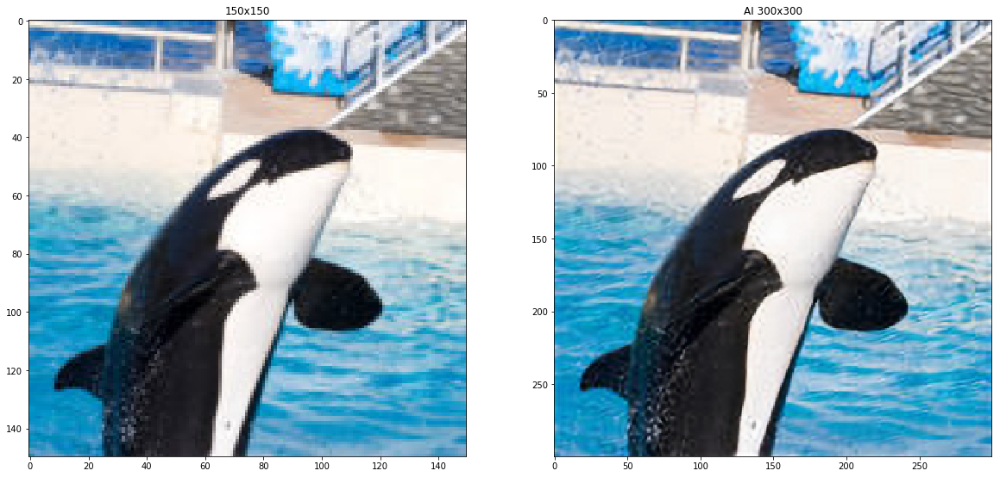

In [5]:
plot_x2('orca-iStock-179286966-16x9-150x150-c.jpg')

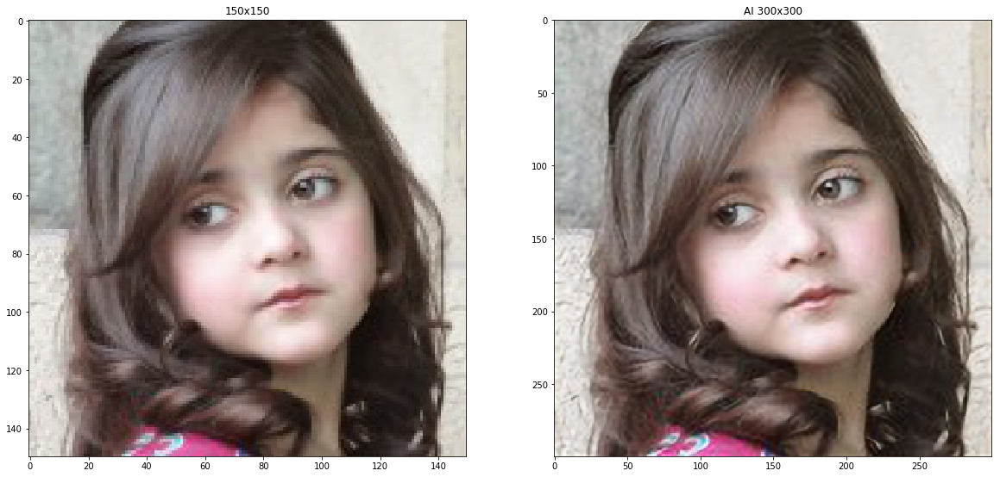

In [6]:
plot_x2('girl-150x150.jpg')

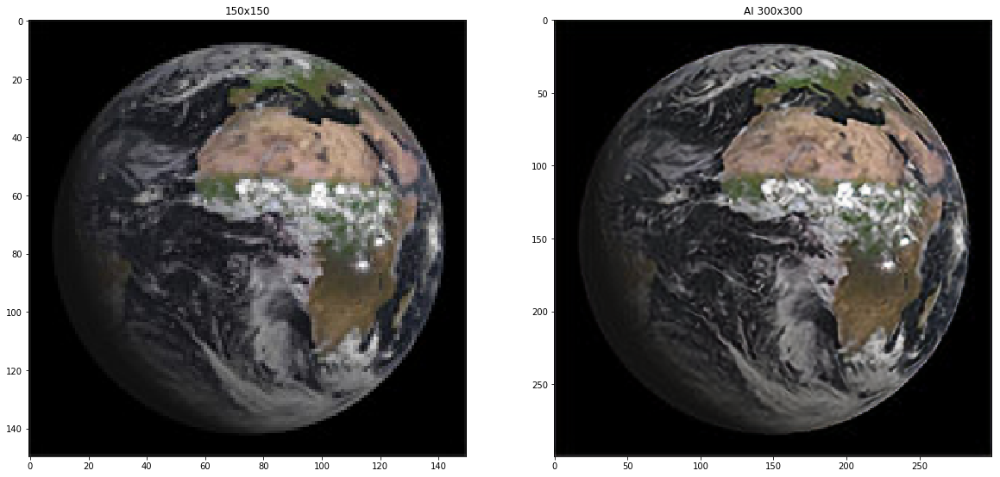

In [7]:
plot_x2('TN_150_MSG3-FIRSTIMAGE.jpg')

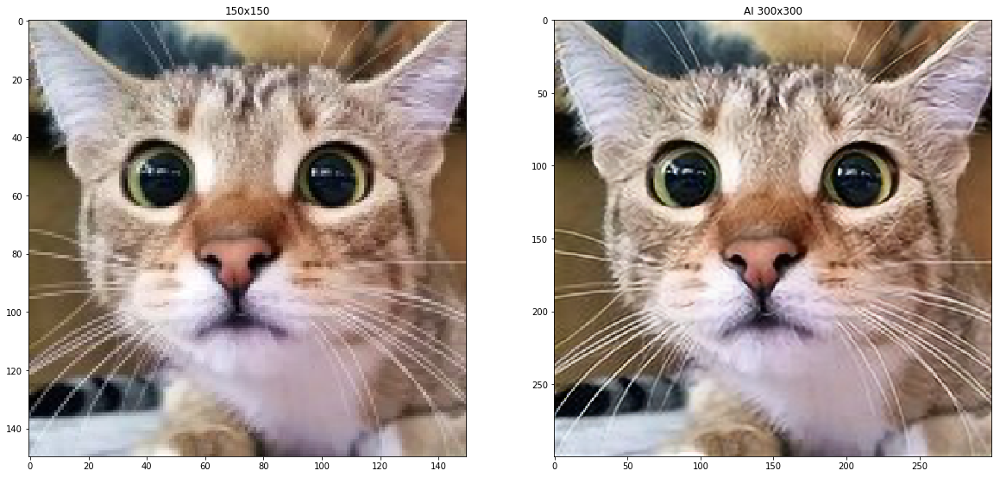

In [8]:
plot_x2('THE-CAT-WATCHING-HORROR-MOVIE-TOGEPI-Cute4Kind-150x150.jpg')

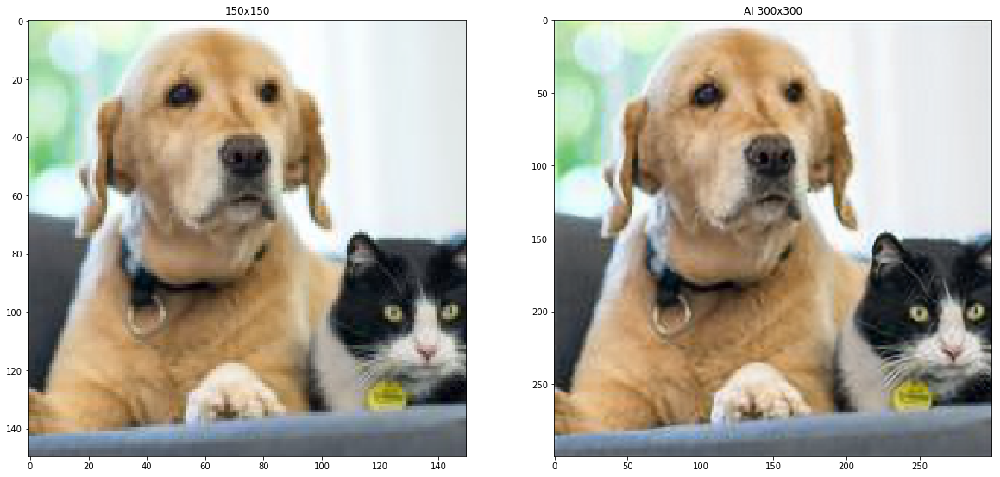

In [9]:
plot_x2('dogcat-150x150.jpg')

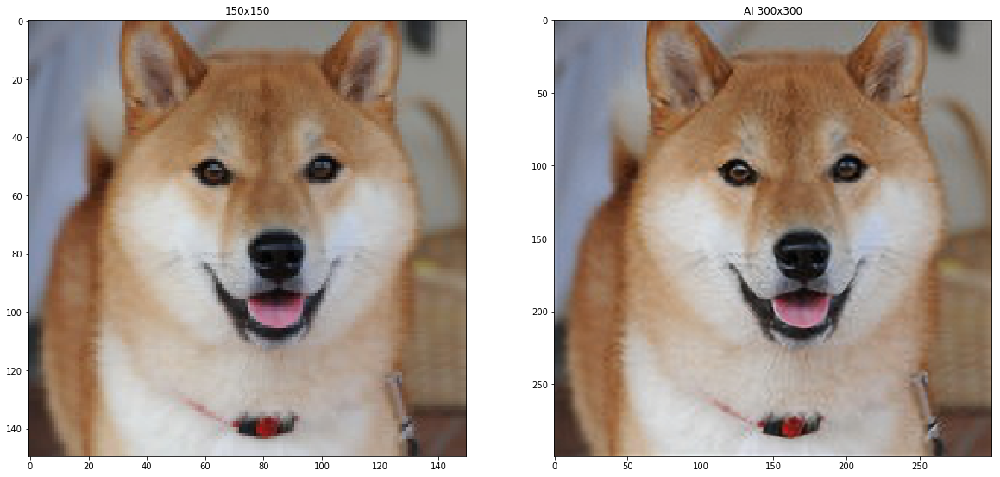

In [10]:
plot_x2('Shiba_inu_taiki-150x150.jpg')

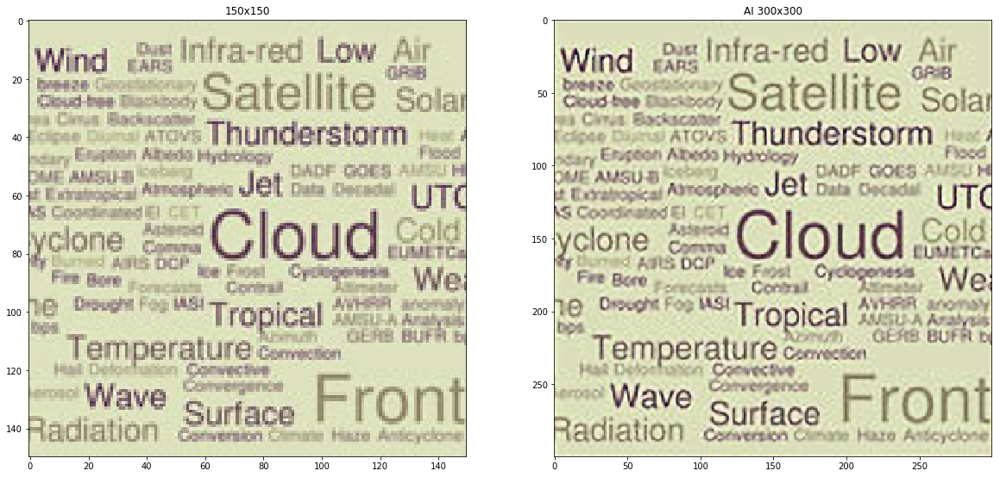

In [11]:
plot_x2('TN_IMAGE_GLOSSARY.jpg')

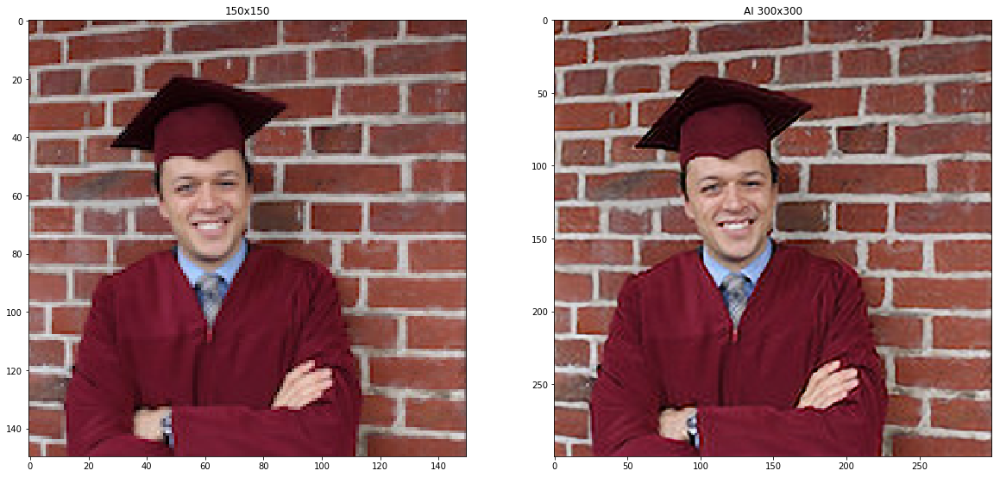

In [12]:
plot_x2('felix.jpg')

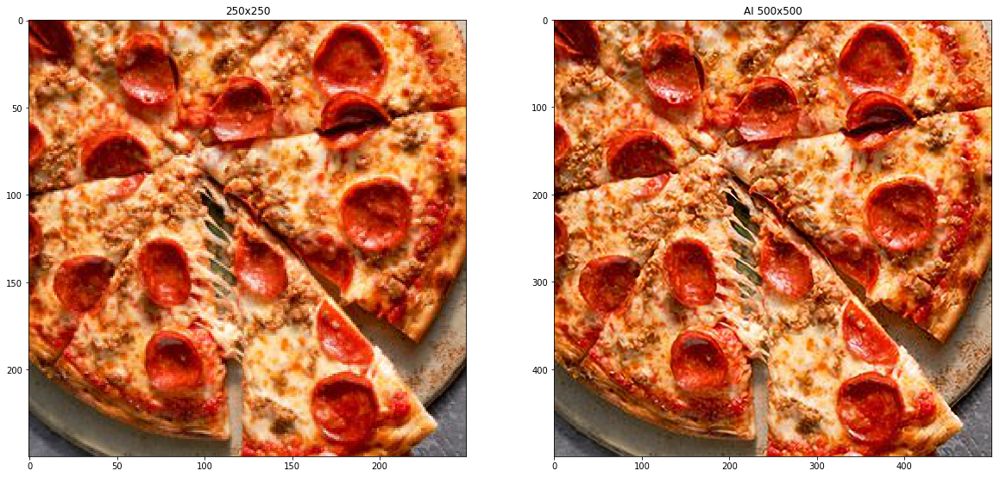

In [13]:
plot_x2('ls.jpg')

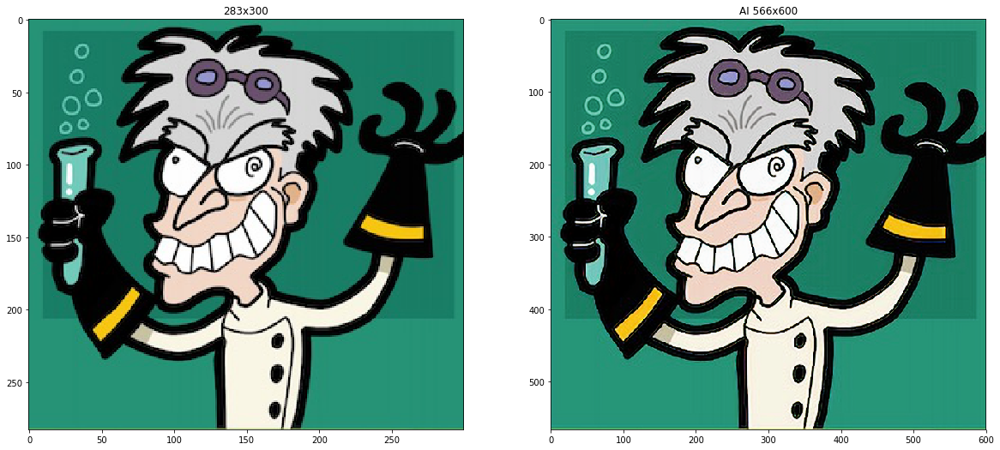

In [14]:
plot_x2('Slide.jpg')

# x4

In [15]:
def plot_x4(image_file):
    directory = '../data/eval'
    plt.figure(1, figsize=(20, 20))
    image = imageio.imread(f'{directory}/{image_file}')
    image = rescale(image=image, scale=1, multichannel=True, anti_aliasing=True)
    image_ai_150 = model.forward(torch.tensor(image.reshape(1,  image.shape[0],  image.shape[1], 3), dtype = torch.float32).transpose(1, 3))
    image_ai = model.forward(image_ai_150)
    plt.subplot(1,3,1) 
    plt.title(f'{image.shape[0]}x{image.shape[1]}')
    plt.imshow(image, interpolation='none')
    plt.subplot(1,3,2) 
    plt.title(f'AI {int(image.shape[0] * 2)}x{int(image.shape[1] * 2)}')
    plt.imshow(image_ai_150.transpose(1, 3).detach().numpy().reshape(int(image.shape[0] * 2), int(image.shape[1] * 2), 3), interpolation='none')
    plt.subplot(1,3,3)
    plt.title(f'AI {int(image.shape[0] * 4)}x{int(image.shape[1] * 4)}')
    plt.imshow(image_ai.transpose(1, 3).detach().numpy().reshape(int(image.shape[0] * 4), int(image.shape[1] * 4), 3), interpolation='none')
    plt.show()

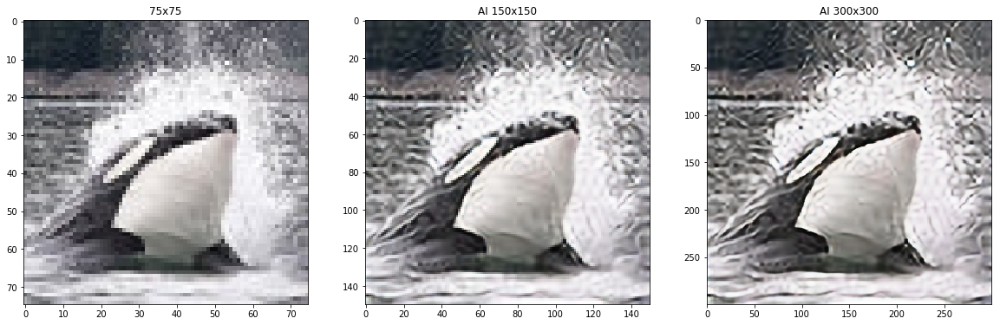

In [16]:
plot_x4('isla_75x75.20780717_g557hkcd.jpg')

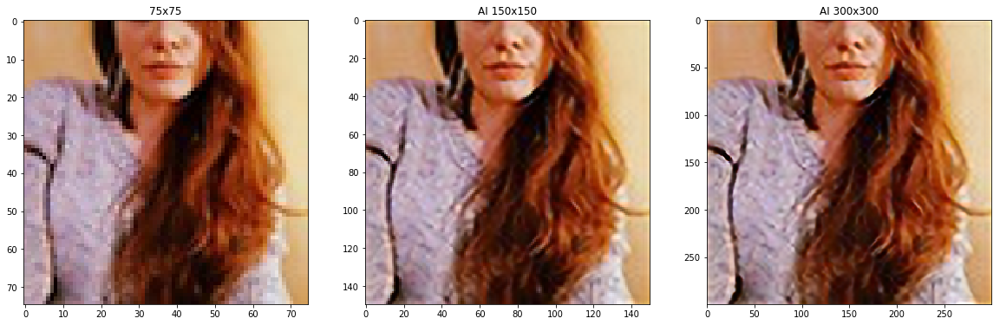

In [17]:
plot_x4('bac1d91976301070b43205d24bf1b7dc.jpg')

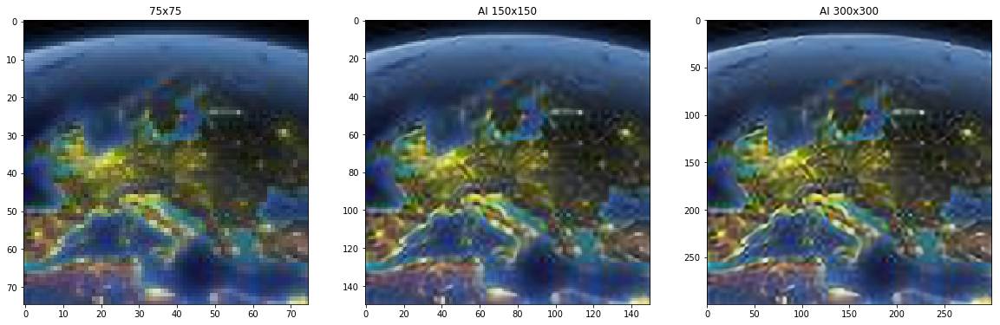

In [18]:
plot_x4('23-featured-75x75.jpg')

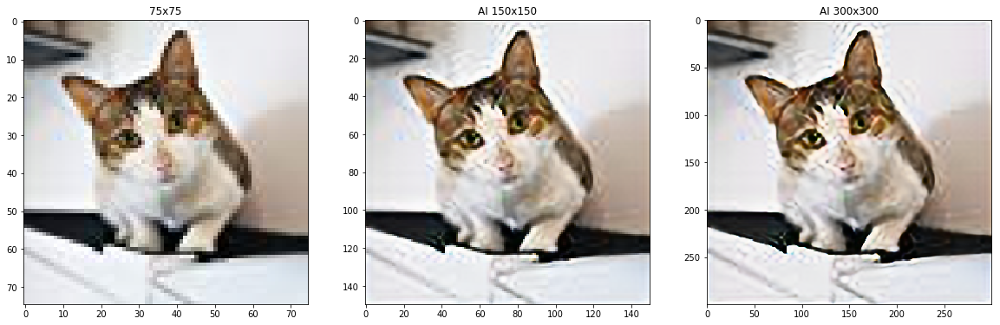

In [19]:
plot_x4('416UHF8hLlL._SL75_.jpg')

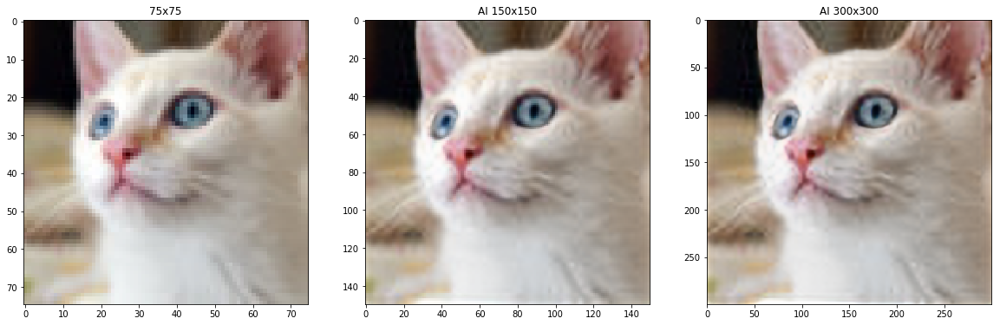

In [20]:
plot_x4('isla_75x75.24534674_ozrbr80h.jpg')

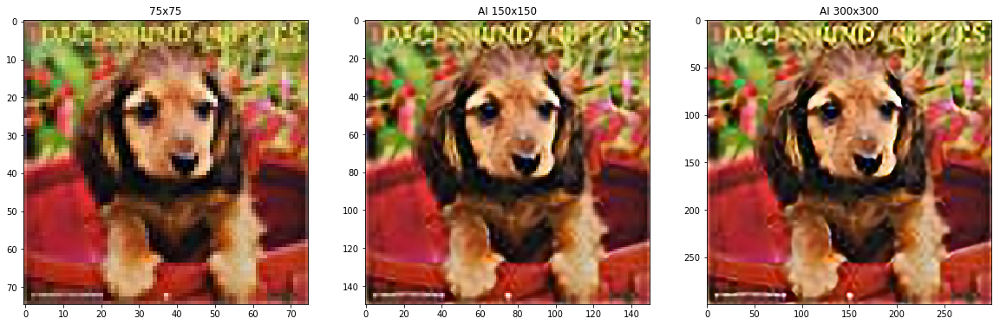

In [21]:
plot_x4('51JgpiGx-RL._SL75_.jpg')

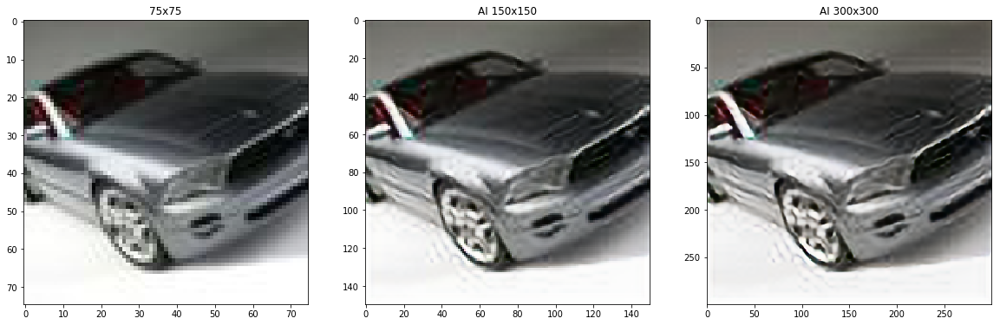

In [22]:
plot_x4('american-car-and-truck-repairs-and-servicing-american-parts-service-centre.jpg')

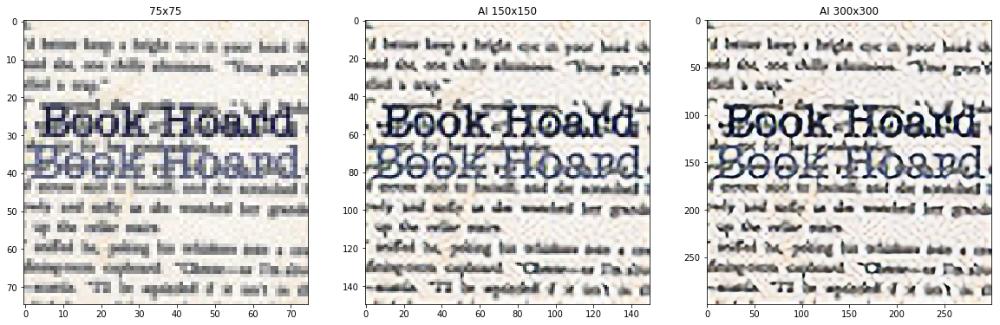

In [23]:
plot_x4('isla_75x75.17609128_oucpprug.jpg')

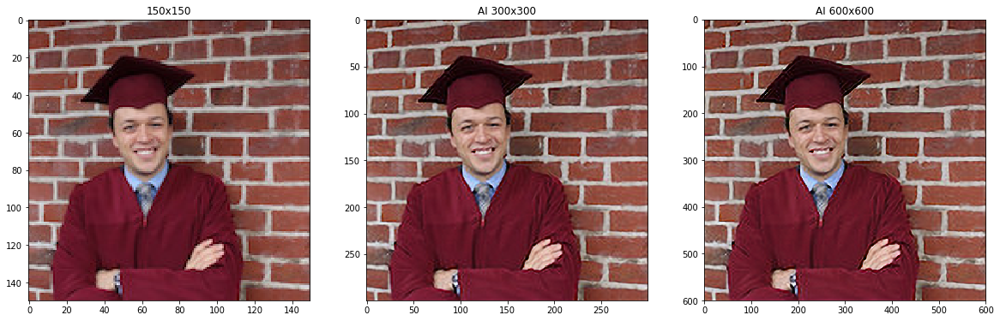

In [24]:
plot_x4('felix.jpg')

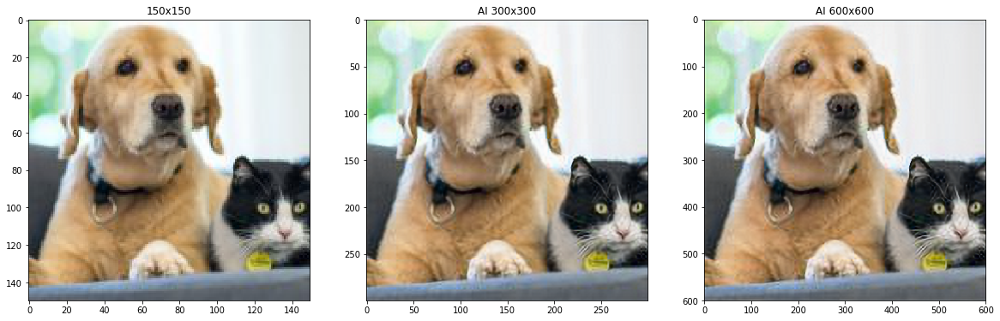

In [25]:
plot_x4('dogcat-150x150.jpg')

# x8

In [26]:
def plot_x8(image_file):
    directory = '../data/eval'
    plt.figure(1, figsize=(12, 12))
    image = imageio.imread(f'{directory}/{image_file}')
    image = rescale(image=image, scale=1, multichannel=True, anti_aliasing=True)
    image_ai_60 = model.forward(torch.tensor(image.reshape(1, image.shape[0],  image.shape[1], 3), dtype = torch.float32).transpose(1, 3))
    image_ai_120 = model.forward(image_ai_60)
    image_ai_240 = model.forward(image_ai_120)
    plt.subplot(2,2,1) 
    plt.title(f'{image.shape[0]}x{image.shape[1]}')
    plt.imshow(image, interpolation='none')
    plt.subplot(2,2,2) 
    plt.title(f'AI {int(image.shape[0] * 2)}x{int(image.shape[1] * 2)}')
    plt.imshow(image_ai_60.transpose(1, 3).detach().numpy().reshape(int(image.shape[0] * 2), int(image.shape[1] * 2), 3), interpolation='none')
    plt.subplot(2,2,3)
    plt.title(f'AI {int(image.shape[0] * 4)}x{int(image.shape[1] * 4)}')
    plt.imshow(image_ai_120.transpose(1, 3).detach().numpy().reshape(int(image.shape[0] * 4), int(image.shape[1] * 4), 3), interpolation='none')
    plt.subplot(2,2,4)
    plt.title(f'AI {int(image.shape[0] * 8)}x{int(image.shape[1] * 8)}')
    plt.imshow(image_ai_240.transpose(1, 3).detach().numpy().reshape(int(image.shape[0] * 8), int(image.shape[1] * 8), 3), interpolation='none')
    plt.show()

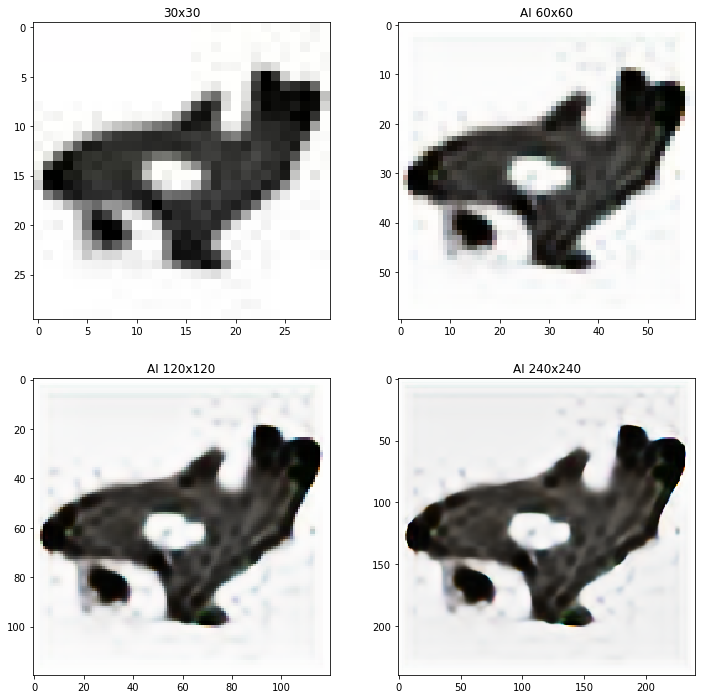

In [27]:
plot_x8('413naUoJXBL._SL30_.jpg')

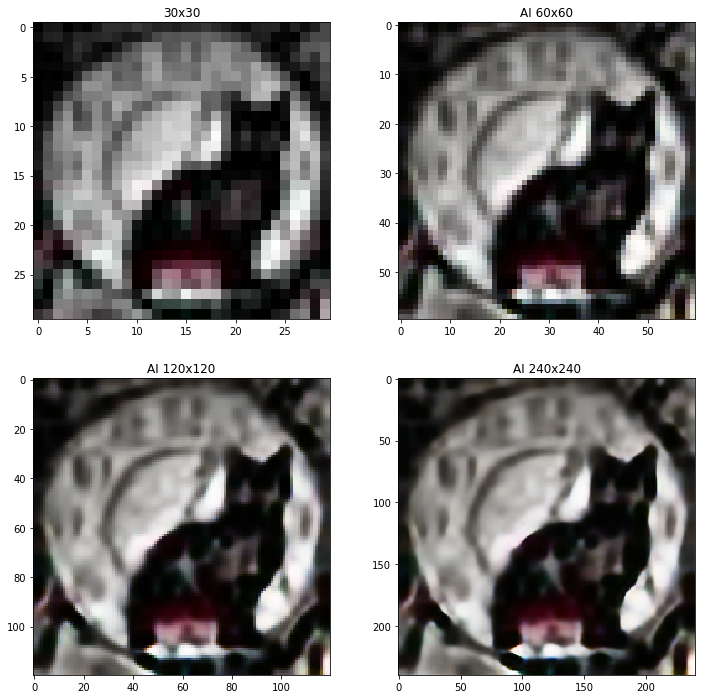

In [28]:
plot_x8('51eanE9gIrL._SL30_.jpg')

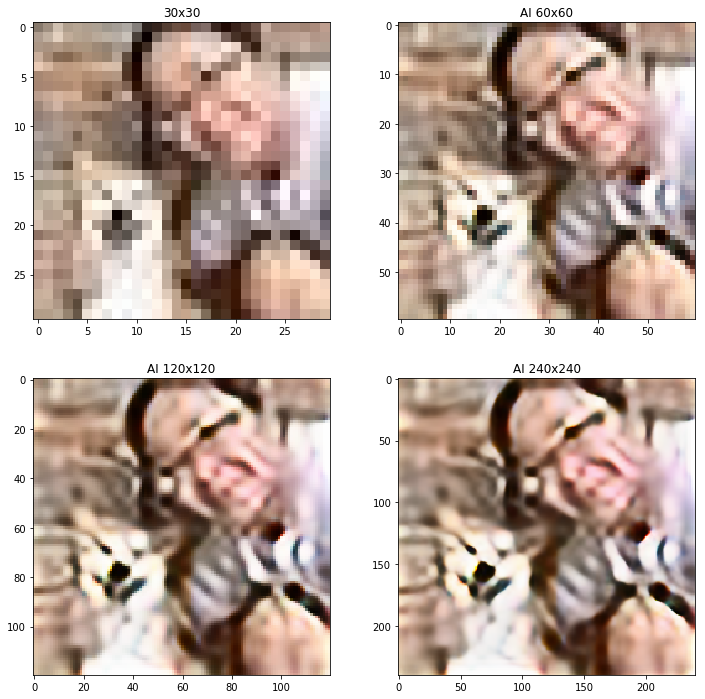

In [29]:
plot_x8('5606164b2c459__30.jpg')

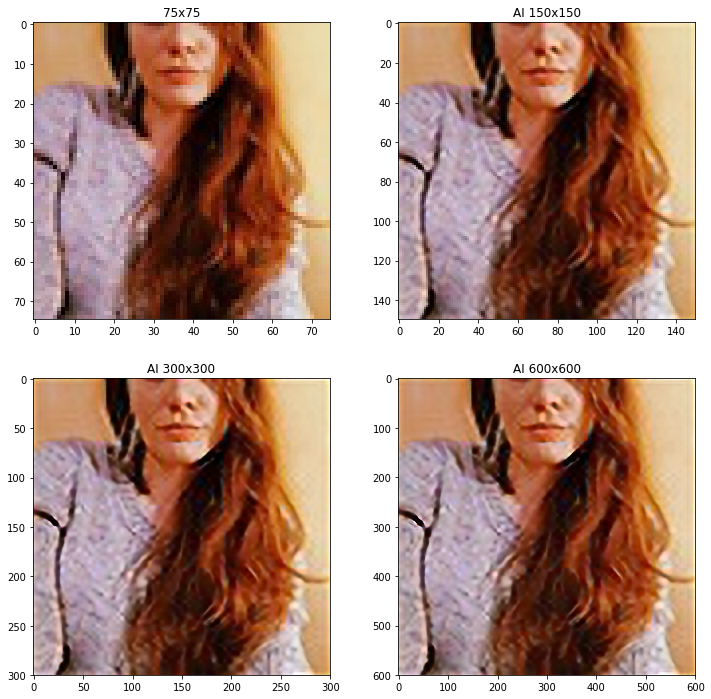

In [30]:
plot_x8('bac1d91976301070b43205d24bf1b7dc.jpg')

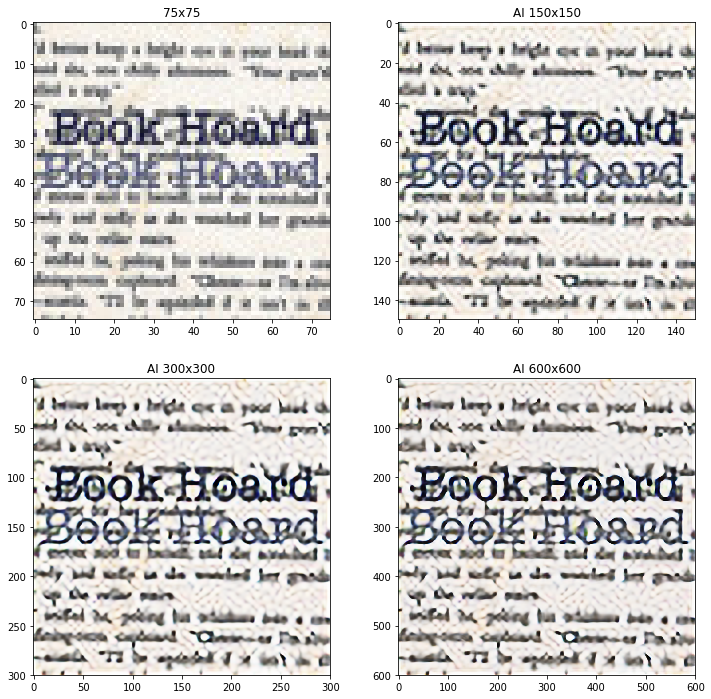

In [31]:
plot_x8('isla_75x75.17609128_oucpprug.jpg') 